# ANALYSIS:
- We are getting 81% accuracy, here I want to analyze these 19% Data point for which we are getting the wrong prediction.
- There could be so many reasons for the wrong prediction, If we could justify any of our wrong prediction then that would be good.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt
import os 
from tqdm.notebook import tqdm
from IPython.display import HTML
from base64 import b64encode
from matplotlib import pyplot as plt
import glob
from random import shuffle
import tensorflow as tf
import sys
import time
from sklearn.metrics import  recall_score, confusion_matrix, accuracy_score
from tensorflow.keras.layers import Conv3D, MaxPooling1D,Embedding,Concatenate, Input,LSTM,BatchNormalization,SpatialDropout1D
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense,GlobalAveragePooling3D
from tensorflow.keras.models import Model
from IPython.display import Image
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## Confusion matrix plot:

In [ ]:
import seaborn as sns
def plot_confusion_matrix(test_y, predict_y):
    """ this function print cunfusion matrix and recall matrix
    """
    labels = [0,1]
    C = confusion_matrix(test_y, predict_y,labels=labels)
    # representing A in heatmap format
    print("-"*20, "Confusion matrix", "-"*20)
    plt.figure(figsize=(5,4))
    sns.heatmap(C, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()


In [ ]:
train_path = '/content/drive/My Drive/2 - хИТхИЖш┐ЗчЪДцХ░цНощЫЖ/train/*/*.avi'
test_path='/content/drive/My Drive/2 - хИТхИЖш┐ЗчЪДцХ░цНощЫЖ/val/*/*.avi'
# read addresses and labels from the folder
addrs_train = glob.glob(train_path)
addrs_test = glob.glob(test_path)
labels_train = [0 if addr.split('/')[-2]=='NonFight' else 1 for addr in addrs_train]  # 0 = no fight, 1 = fight
labels_test = [0 if addr.split('/')[-2]=='NonFight' else 1 for addr  in addrs_test]

# Best Model:

In [ ]:
def SELayer(layer):
    pool=tf.math.reduce_mean(layer, axis=[2,3,4], keepdims=True, name=None)
    flatt=Flatten()(pool)
    fc1=tf.keras.layers.Dense(int(layer.shape[1]/2), activation='relu',kernel_initializer='he_uniform')(flatt)
    fc2=tf.keras.layers.Dense(layer.shape[1], activation='relu',kernel_initializer='he_uniform')(fc1)
    sig=tf.keras.layers.Activation('sigmoid')(fc2)
    mul=tf.keras.layers.Multiply()([layer,tf.reshape(sig,shape=(-1,layer.shape[1],1,1,1))])
    return mul

In [ ]:
def conv3Dnet_a(layer,k_size,pool_size):
    conv=Conv3D(kernel_size=k_size,filters=5,activation='relu',kernel_initializer='he_uniform')(layer)
    drop1=Dropout(0.1)(conv)
    norm=tf.keras.layers.BatchNormalization()(drop1)
    act=tf.keras.layers.Activation('relu')(norm)
    pool=tf.keras.layers.MaxPooling3D(pool_size=pool_size)(act)
    return pool

In [ ]:
def conv3Dnet_b(layer,k1_size,k2_size,pool_size):
    conv1=Conv3D(kernel_size=k1_size,filters=3,activation='relu',kernel_initializer='he_uniform')(layer)
    drop1=Dropout(0.1)(conv1)
    norm=tf.keras.layers.BatchNormalization()(drop1)
    act1=tf.keras.layers.Activation('relu')(norm)
    conv2=Conv3D(kernel_size=k2_size,filters=3,activation='relu',kernel_initializer='he_uniform')(act1)
    drop2=Dropout(0.1)(conv2)
    act2=tf.keras.layers.Activation('relu')(drop2)
    pool=tf.keras.layers.MaxPooling3D(pool_size=pool_size)(act2)
    return pool

In [ ]:
tf.keras.backend.clear_session()
input=Input((20,224,224,3))
con_net_1=conv3Dnet_a(input,k_size=(3,5,5),pool_size=(2,2,2))
se_1=SELayer(con_net_1)
con_net_2=conv3Dnet_a(se_1,k_size=(2,3,3),pool_size=(2,2,2))
se_2=SELayer(con_net_2)
con_net_3=conv3Dnet_a(se_2,k_size=(1,2,2),pool_size=(1,2,2))
se_3=SELayer(con_net_3)
con_net_4=conv3Dnet_b(se_3,k1_size=(1,2,2),k2_size=(1,2,2),pool_size=(1,2,2))
se_4=SELayer(con_net_4)
con_net_5=conv3Dnet_b(se_4,k1_size=(1,2,2),k2_size=(1,2,2),pool_size=(1,2,2))
se_5=SELayer(con_net_5)
flatt=Flatten()(se_5)
drop3=Dropout(0.4)(flatt)
fc1=tf.keras.layers.Dense(512, activation='relu',kernel_initializer='he_uniform')(drop3)
drop4=Dropout(0.4)(fc1)
fc2=tf.keras.layers.Dense(100, activation='relu',kernel_initializer='he_uniform')(drop4)
drop5=Dropout(0.3)(fc2)
out=tf.keras.layers.Dense(1, activation='sigmoid')(drop5)
model_6=Model(inputs=input, outputs=out)
model_6.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0007),
                loss='binary_crossentropy',metrics=['accuracy'])

model_6.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 20, 224, 224 0                                            
__________________________________________________________________________________________________
conv3d (Conv3D)                 (None, 18, 220, 220, 1130        input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 18, 220, 220, 0           conv3d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 18, 220, 220, 20          dropout[0][0]                    
_______________________________________________________________________________________

In [ ]:
model_6.load_weights('/content/drive/My Drive/cs_2/mdl6_wts.hdf5')

## Confusion matrix for train data:
- Here I kept probability threshould as 0.4.


validation confusion matrix:
-------------------- Confusion matrix --------------------


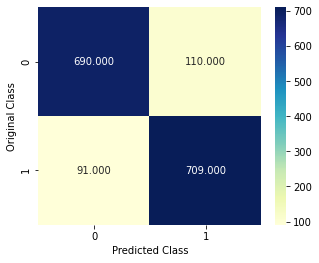

validation accuracy: 0.874375


In [ ]:
import pandas as pd
out=pd.DataFrame()
pred_proba=[]
true_val=[]
pred_val=[]
for i in tqdm(range(len(addrs_train))):
    vidcap = cv2.VideoCapture(addrs_train[i])
    #success,frame = vidcap.read()
    count = 0
    frames=[]
    success=True
    while success and count<20:
        vidcap.set(cv2.CAP_PROP_POS_MSEC,(count*250))
        success,frame= vidcap.read()
        frame = cv2.resize(frame,(224,224), interpolation=cv2.INTER_AREA)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = np.reshape(frame, (224,224,3))
        frames.append(frame)  
        count += 1

    frames = np.array(frames)
    vidcap.release()
    image=tf.image.per_image_standardization(frames)
    image=tf.reshape(image,shape=(1,20,224,224,3))
    p=model_6.predict(image)
    pred_proba.append(p[0][0])
    if p[0][0]>0.4:
        pred_val.append(1)
    else:
        pred_val.append(0)
    true_val.append(labels_train[i])
print('validation confusion matrix:')
plot_confusion_matrix(true_val, pred_val)
print('validation accuracy:',accuracy_score(true_val, pred_val))

## Confusion matrix for validation data:


validation confusion matrix:
-------------------- Confusion matrix --------------------


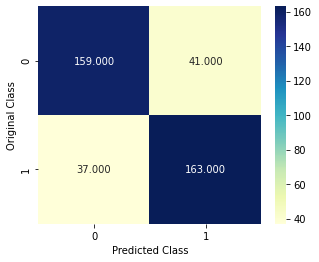

validation accuracy: 0.805


In [ ]:
import pandas as pd
out=pd.DataFrame()
pred_proba=[]
true_val=[]
pred_val=[]
for i in tqdm(range(len(addrs_test))):
    vidcap = cv2.VideoCapture(addrs_test[i])
    #success,frame = vidcap.read()
    count = 0
    frames=[]
    success=True
    while success and count<20:
        vidcap.set(cv2.CAP_PROP_POS_MSEC,(count*250))
        success,frame= vidcap.read()
        frame = cv2.resize(frame,(224,224), interpolation=cv2.INTER_AREA)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = np.reshape(frame, (224,224,3))
        frames.append(frame)  
        count += 1

    frames = np.array(frames)
    vidcap.release()
    image=tf.image.per_image_standardization(frames)
    image=tf.reshape(image,shape=(1,20,224,224,3))
    p=model_6.predict(image)
    pred_proba.append(p[0][0])
    if p[0][0]>0.4:
        pred_val.append(1)
    else:
        pred_val.append(0)
    true_val.append(labels_test[i])
print('validation confusion matrix:')
plot_confusion_matrix(true_val, pred_val)
print('validation accuracy:',accuracy_score(true_val, pred_val))

- I got 80% accuracy for validation but there is 87% accuracy for train mean here some overfitting but by keeping the threshold as 0.4 we got a less false negative.

In [ ]:
test_out=pd.DataFrame()
test_out['true']=true_val
test_out['pred']=pred_val
test_out['proba']=pred_proba
test_out.head()

,true,pred,proba
0,1,1,0.660438
1,1,1,0.837658
2,1,1,0.823982
3,1,1,0.856911
4,1,1,0.777072


## False negative in validation data:

In [ ]:
a=test_out[test_out['true']==1]
a[a['pred']==0].index

Int64Index([  6,   7,   8,  14,  28,  29,  31,  32,  33,  41,  44,  54,  55,
             78,  79,  82,  83,  84, 108, 109, 117, 118, 119, 120, 121, 126,
            129, 154, 166, 168, 171, 180, 182, 183, 190, 192, 194],
           dtype='int64')

In [ ]:
print('VIOLENCE VIDEO:')
def convert_avi_to_mp4(avi_file_path, output_name):
    os.popen("ffmpeg -i '{input}' -ac 2 -b:v 2000k -c:a aac -c:v libx264 -b:a 160k -vprofile high -bf 0 -strict experimental -f mp4 '{output}.mp4'".format(input = avi_file_path, output = output_name))
    return True
  
convert_avi_to_mp4(addrs_test[6],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

VIOLENCE VIDEO:


In [ ]:
print('VIOLENCE VIDEO:')
def convert_avi_to_mp4(avi_file_path, output_name):
    os.popen("ffmpeg -i '{input}' -ac 2 -b:v 2000k -c:a aac -c:v libx264 -b:a 160k -vprofile high -bf 0 -strict experimental -f mp4 '{output}.mp4'".format(input = avi_file_path, output = output_name))
    return True
  
convert_avi_to_mp4(addrs_test[8],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

VIOLENCE VIDEO:


- Above 2 videos are very blurry, it is very hard to find violence in it  for us also.

In [ ]:
convert_avi_to_mp4(addrs_test[41],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

- The distance of the camera is large. 
- By visualizing that small part of the video we humans also can't surely say that there is violence or not.

In [ ]:
convert_avi_to_mp4(addrs_test[82],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[119],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[194],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[28],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[129],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[182],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

- The camera is not covering the whole action of violence.

### Conclusion:
- There are some video contains violence but predicted as non-violence, we can justify some of these because we humans also can't detect violence from these videos.
- When the video is blurry, or the camera is placed far, or very less part of violent action is covered by the camera, these are some of reason for this wrong prediction.
-  There are some videos where all parameters are fine still prediction is non-violence which actually a bad part of our model.

## Flase positive in validation data:

In [ ]:
a=test_out[test_out['true']==0]
a[a['pred']==1].index

Int64Index([203, 206, 207, 208, 215, 225, 234, 236, 243, 252, 255, 261, 264,
            272, 281, 282, 286, 293, 294, 305, 307, 308, 310, 319, 320, 323,
            327, 331, 332, 333, 345, 348, 353, 357, 371, 373, 374, 377, 383,
            385, 389],
           dtype='int64')

In [ ]:
convert_avi_to_mp4(addrs_test[203],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[255],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[293],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[353],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[389],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
convert_avi_to_mp4(addrs_test[307],'video1_fight')
mp4 = open('/content/video1_fight.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

### Conclusion:
- When there is low light then the video gets predicted as violence even there is no violence.
- When an area is crowded in a video then it predicted there is violence.
- I can't justify any of these false positives.

## Confusion matrix for validation with threshold as 0.5:


validation confusion matrix:
-------------------- Confusion matrix --------------------


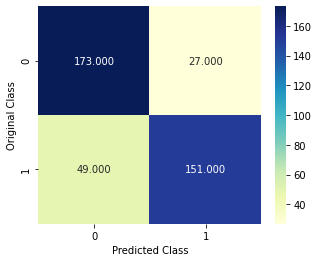

validation accuracy: 0.81


In [ ]:
import pandas as pd
out=pd.DataFrame()
pred_proba=[]
true_val=[]
pred_val=[]
for i in tqdm(range(len(addrs_test))):
    vidcap = cv2.VideoCapture(addrs_test[i])
    #success,frame = vidcap.read()
    count = 0
    frames=[]
    success=True
    while success and count<20:
        vidcap.set(cv2.CAP_PROP_POS_MSEC,(count*250))
        success,frame= vidcap.read()
        frame = cv2.resize(frame,(224,224), interpolation=cv2.INTER_AREA)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = np.reshape(frame, (224,224,3))
        frames.append(frame)  
        count += 1

    frames = np.array(frames)
    vidcap.release()
    image=tf.image.per_image_standardization(frames)
    image=tf.reshape(image,shape=(1,20,224,224,3))
    p=model_7.predict(image)
    pred_proba.append(p[0][0])
    if p[0][0]>0.5:
        pred_val.append(1)
    else:
        pred_val.append(0)
    true_val.append(labels_test[i])
print('validation confusion matrix:')
plot_confusion_matrix(true_val, pred_val)
print('validation accuracy:',accuracy_score(true_val, pred_val))

- Even here the accuracy is higher by 1% , but false positive is high.